In [1]:
import numpy as np
import pandas as pd

from dataprep.eda import *
# import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import re

import matplotlib.pyplot as plt
import seaborn as sns

## Analyse Exploratoire

* ETF : ETF (Exchange Traded Fund ) ou FNB (fonds négocié en bourse) en français est un type de titre qui suit un indice , un secteur, une marchandise ou un autre actif, mais qui peut être acheté ou vendu en bourse de la même manière qu'une action ordinaire.<br><br>
* Date : La date du jour.<br><br>
* Open : Prix du ETF de l'or a l'ouverture du marché.<br><br>
* High : Prix du ETF de l'or le plus haut de la journée.<br><br>
* Low : Prix du ETF de l'or le plus bas de la journée.<br><br>
* Close : Prix du ETF de l'or à la Clôture  du marché.<br><br>
* Adj Close : Prix adjuté du ETF de l'or à la clôture du marché.<br><br>
* Volume : quantité de ETF de l'or disponible pour le jour.<br><br>
* Indice S&P 500 ou SP : Le S&P 500 est un indice boursier basé sur 500 grandes sociétés      cotées sur les bourses aux États-Unis (NYSE ou NASDAQ). L'indice est possédé et géré par Standard & Poor's, l'une des trois principales sociétés de notation financière.<br><br>
* Indice Dow Jones ou DJ : Le Dow Jones Industrial Average (abrégé en DJIA et souvent raccourci en Dow Jones) est le plus vieil indice des bourses de New York et le plus vieil indice boursier du monde.<br><br>
* Eldorado Gold Corporation (EGO) ou EG : Eldorado Gold Corp est un producteur d'or et de métaux de base basé au Canada avec des opérations d'extraction<br><br>
* EU : Taux de change EURO - USD<br><br>
* OF : Contrats à terme sur le pétrole brut Brent.<br><br>
* OS : Prix du Pétrole brut en USD<br><br>
* SF : Contrats à terme sur l'argent.<br><br>
* USB : Taux des obligations américaines (10 ans).<br><br>
* PLT : Prix du platine.<br><br>
* PLD_trend : Prix du palladium.<br><br>
* RHO_trend : Prix du Rhodium<br><br>
* USDI : Indice du dollar américain.<br><br>
* GDX : ETF des mineurs d'or.<br><br>
* USO : Pétrole ETF.<br><br>

**Variable à predire**
* Adjusted Close

### a - Identification de la variable cible

La variable à prédir est **`Adjusted Close`**

In [2]:
data = pd.read_csv("FINAL_USO.csv", na_values=['null'],index_col='Date',parse_dates=True,infer_datetime_format=True)

In [3]:
df = data.copy()

In [4]:
info_or = df[df.columns[:6]]

### b - Nombre des lignes et de colonnes 

In [5]:
df.shape

(1718, 80)

Le jeu de donnée comporte 1718 lignes et 80 colonnes

### c - Identification des valeurs manquantes 

  0%|                                                                                          | 0/705 [00:00<…


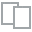
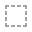
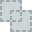
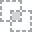
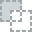
...
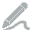
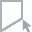
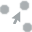
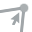
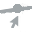

In [6]:
plot_missing(df)

Il n'y a accune valeur manquante dans le jeu de donnée

### d- Types de variables

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1718 entries, 2011-12-15 to 2018-12-31
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Open           1718 non-null   float64
 1   High           1718 non-null   float64
 2   Low            1718 non-null   float64
 3   Close          1718 non-null   float64
 4   Adj Close      1718 non-null   float64
 5   Volume         1718 non-null   int64  
 6   SP_open        1718 non-null   float64
 7   SP_high        1718 non-null   float64
 8   SP_low         1718 non-null   float64
 9   SP_close       1718 non-null   float64
 10  SP_Ajclose     1718 non-null   float64
 11  SP_volume      1718 non-null   int64  
 12  DJ_open        1718 non-null   float64
 13  DJ_high        1718 non-null   float64
 14  DJ_low         1718 non-null   float64
 15  DJ_close       1718 non-null   float64
 16  DJ_Ajclose     1718 non-null   float64
 17  DJ_volume      1718 non-null   int

### e - Visualisation de la cible (target)

In [8]:
# fig = px.line(df, x=df.index, y="Adj Close", title="Evolution du prix de l'OR par ans")
# fig.update_xaxes(
#     rangeslider_visible=False,
#     rangeselector=dict(
#         buttons=list([
#             dict(count=1, label="1m", step="month", stepmode="backward"),
#             dict(count=6, label="6m", step="month", stepmode="backward"),
#             dict(count=1, label="YTD", step="year", stepmode="todate"),
#             dict(count=1, label="1y", step="year", stepmode="backward"),
#             dict(step="all")
#         ])
#     )
# )
# fig.show()

In [9]:
data_or_year = pd.DataFrame(df['Adj Close'].resample('Y').mean()) # Moyenne par annéé du prix de l'or

fig = go.Figure()
fig.add_trace(go.Scatter(x=df.index, y=df['Adj Close'],
                        mode='lines', name='Prix'))
fig.add_trace(go.Scatter(x=data_or_year.index, y=data_or_year['Adj Close'],
                        mode='lines', name="Tendance par mois"))

fig.update_layout(title="Prix de l'Or de 2012 à 2018",
                  xaxis_title="Date", yaxis_title="Prix en $")


In [10]:
data11 = pd.DataFrame(df.loc['2011']['Adj Close'])
data12 = pd.DataFrame(df.loc['2012']['Adj Close'])
data13 = pd.DataFrame(df.loc['2013']['Adj Close'])
data14 = pd.DataFrame(df.loc['2014']['Adj Close'])
data15 = pd.DataFrame(df.loc['2015']['Adj Close'])
data16 = pd.DataFrame(df.loc['2016']['Adj Close'])
data17 = pd.DataFrame(df.loc['2017']['Adj Close'])
data18 = pd.DataFrame(df.loc['2018']['Adj Close'])
data_year = [data11, data12, data13, data14, data15, data16, data17, data18]

In [11]:
data_or_month_mean = pd.DataFrame(data12['Adj Close'].resample('M').mean())

fig = go.Figure()
fig.add_trace(go.Scatter(x=data12.index, y=data12['Adj Close'],
                        mode='lines', name='Prix'))
fig.add_trace(go.Scatter(x=data_or_month_mean.index, y=data_or_month_mean['Adj Close'],
                        mode='lines', name="Tendance par mois"))
fig.update_xaxes(
    dtick="M1",
    tickformat="%b\n%Y",
    ticklabelmode="period")

fig.update_layout(title="Prix de l'Or en 2012",
                  xaxis_title="Date", yaxis_title="Prix en $")


In [12]:
data_or_month_mean = pd.DataFrame(data13['Adj Close'].resample('M').mean())

fig = go.Figure()
fig.add_trace(go.Scatter(x=data13.index, y=data13['Adj Close'],
                        mode='lines', name='Prix'))
fig.add_trace(go.Scatter(x=data_or_month_mean.index, y=data_or_month_mean['Adj Close'],
                        mode='lines', name="Tendance par mois"))
fig.update_xaxes(
    dtick="M1",
    tickformat="%b\n%Y",
    ticklabelmode="period")

fig.update_layout(title="Prix de l'Or en 2013",
                  xaxis_title="Date", yaxis_title="Prix en $")


In [13]:
data_or_month_mean = pd.DataFrame(data14['Adj Close'].resample('M').mean())

fig = go.Figure()
fig.add_trace(go.Scatter(x=data14.index, y=data14['Adj Close'],
                        mode='lines', name='Prix'))
fig.add_trace(go.Scatter(x=data_or_month_mean.index, y=data_or_month_mean['Adj Close'],
                        mode='lines', name="Tendance par mois"))
fig.update_xaxes(
    dtick="M1",
    tickformat="%b\n%Y",
    ticklabelmode="period")

fig.update_layout(title="Prix de l'Or en 2014",
                  xaxis_title="Date", yaxis_title="Prix en $")

In [14]:
data_or_month_mean = pd.DataFrame(data15['Adj Close'].resample('M').mean())

fig = go.Figure()
fig.add_trace(go.Scatter(x=data15.index, y=data15['Adj Close'],
                        mode='lines', name='Prix'))
fig.add_trace(go.Scatter(x=data_or_month_mean.index, y=data_or_month_mean['Adj Close'],
                        mode='lines', name="Tendance par mois"))
fig.update_xaxes(
    dtick="M1",
    tickformat="%b\n%Y",
    ticklabelmode="period")

fig.update_layout(title="Prix de l'Or en 2015",
                  xaxis_title="Date", yaxis_title="Prix en $")

In [15]:
data_or_month_mean = pd.DataFrame(data16['Adj Close'].resample('M').mean())

fig = go.Figure()
fig.add_trace(go.Scatter(x=data16.index, y=data16['Adj Close'],
                        mode='lines', name='Prix'))
fig.add_trace(go.Scatter(x=data_or_month_mean.index, y=data_or_month_mean['Adj Close'],
                        mode='lines', name="Tendance par mois"))
fig.update_xaxes(
    dtick="M1",
    tickformat="%b\n%Y",
    ticklabelmode="period")

fig.update_layout(title="Prix de l'Or en 2016",
                  xaxis_title="Date", yaxis_title="Prix en $")

In [16]:
data_or_month_mean = pd.DataFrame(data17['Adj Close'].resample('M').mean())

fig = go.Figure()
fig.add_trace(go.Scatter(x=data17.index, y=data17['Adj Close'],
                        mode='lines', name='Prix'))
fig.add_trace(go.Scatter(x=data_or_month_mean.index, y=data_or_month_mean['Adj Close'],
                        mode='lines', name="Tendance par mois"))
fig.update_xaxes(
    dtick="M1",
    tickformat="%b\n%Y",
    ticklabelmode="period")

fig.update_layout(title="Prix de l'Or en 2017",
                  xaxis_title="Date", yaxis_title="Prix en $")

In [17]:
data_or_month_mean = pd.DataFrame(data18['Adj Close'].resample('M').mean())

fig = go.Figure()
fig.add_trace(go.Scatter(x=data18.index, y=data18['Adj Close'],
                        mode='lines', name='Prix'))
fig.add_trace(go.Scatter(x=data_or_month_mean.index, y=data_or_month_mean['Adj Close'],
                        mode='lines', name="Tendance par mois"))
fig.update_xaxes(
    dtick="M1",
    tickformat="%b\n%Y",
    ticklabelmode="period")

fig.update_layout(title="Prix de l'Or en 2018",
                  xaxis_title="Date", yaxis_title="Prix en $")

In [18]:
#

### g- Visualisation des relations : features/target 

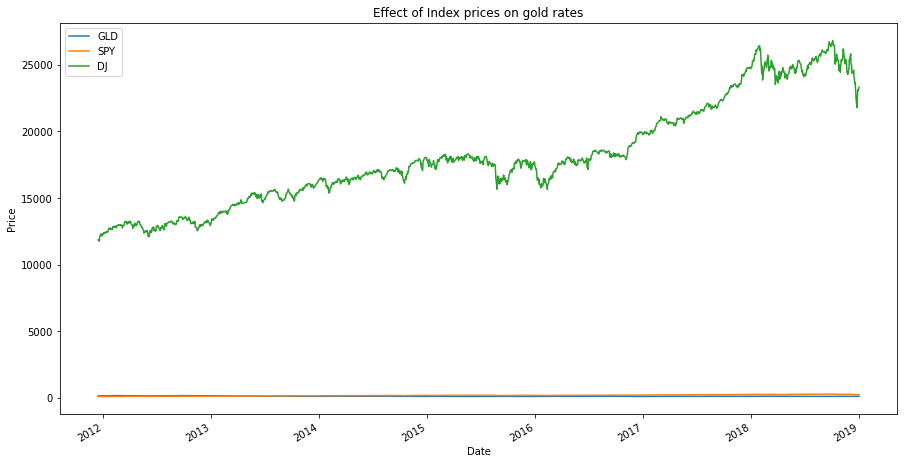

In [19]:
GLD_adj_close = df['Adj Close']
SPY_adj_close = df['SP_Ajclose']
DJ_adj_close  = df['DJ_Ajclose']

df_p = pd.DataFrame({'GLD':GLD_adj_close, 'SPY':SPY_adj_close, 'DJ':DJ_adj_close})

df_ax = df_p.plot(title='Effect of Index prices on gold rates',figsize=(15,8))

df_ax.set_ylabel('Price')
df_ax.legend(loc='upper left')
plt.show()

In [20]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=info_or.index, y=info_or['Adj Close'],
                        mode='lines', name='Prix Ajusté'))
fig.add_trace(go.Scatter(x=info_or.index, y=info_or['Open'],
                        mode='lines', name="Prix d'Ouverture"))
fig.add_trace(go.Scatter(x=info_or.index, y=info_or['Close'],
                        mode='lines', name='Prix de Clôture',
                        ))

fig.update_layout(title="Prix de l'Or 2012 - 2018",
                  xaxis_title="Date", yaxis_title="Prix en $")
# fig.update_layout(
# xaxis=dict(
# showline=True, showgrid=False, showticklabels=True,
# linecolor='rgb(204, 204, 204)',
# linewidth=2, ticks='outside', tickfont=dict(
# family='Arial', size=12, color='rgb(82, 82, 82)'
# ),
# ),
# yaxis=dict(showgrid=False, zeroline=False, showline=False, showticklabels=False),
# autosize=False,
# margin=dict(
# autoexpand=False, l=100, r=20, t=110),
# showlegend=False, plot_bgcolor='white')

In [21]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=info_or.index, y=info_or['Adj Close'],
                        mode='lines', name='Prix Ajusté'))
fig.add_trace(go.Scatter(x=info_or.index, y=info_or['High'],
                        mode='lines', name="Prix le plus élevé"))
fig.add_trace(go.Scatter(x=info_or.index, y=info_or['Low'],
                        mode='lines', name='Prix le plus bas',
                        ))

fig.update_layout(title="Prix de l'Or 2012 - 2018",
                  xaxis_title="Date", yaxis_title="Prix en $")
fig.update_xaxes(
    rangeslider_visible=False,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)

In [22]:
val_aj_close = ["Adj Close", "SP_Ajclose", "DJ_Ajclose", "EG_Ajclose", "GDX_Adj Close", "USO_Adj Close"]

In [23]:
ajusted_prices = df[val_aj_close]

In [24]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=ajusted_prices.index, y=ajusted_prices['Adj Close'],
                        mode='lines+markers', name="Prix: OR"))
for col in ajusted_prices.columns[1:]:
    fig.add_trace(go.Scatter(x=ajusted_prices.index, y=ajusted_prices[col],
                        mode='lines', name=col))
    

fig.update_layout(title="Différent Prix Ajusté",
                  xaxis_title="Date", yaxis_title="Prix en $")
fig.update_xaxes(
    rangeslider_visible=False,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)

In [25]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df.index, y=df['Close'],
                        mode='lines+markers', name="Prix: OR"))

for col in df.columns:
    if 'close' in col:
#         print(col)
        fig.add_trace(go.Scatter(x=df.index, y=df[col],
                    mode='lines', name=col))


fig.update_layout(title="Comparaison des prix de Clôtures",
                  xaxis_title="Date", yaxis_title="Prix en $")
fig.update_xaxes(
    rangeslider_visible=False,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)

<Figure size 864x432 with 0 Axes>

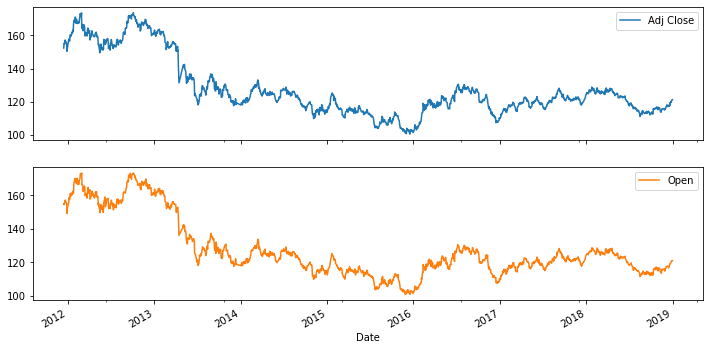

<Figure size 864x432 with 0 Axes>

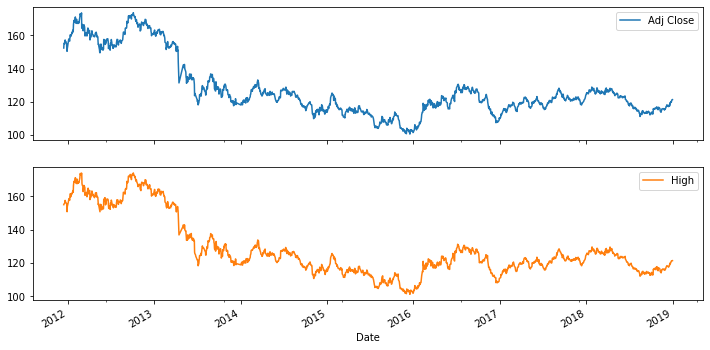

<Figure size 864x432 with 0 Axes>

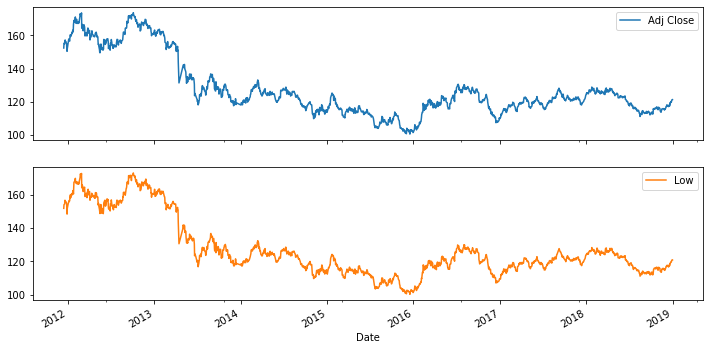

<Figure size 864x432 with 0 Axes>

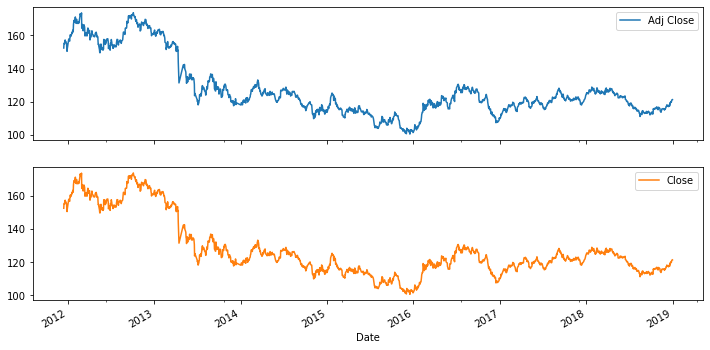

<Figure size 864x432 with 0 Axes>

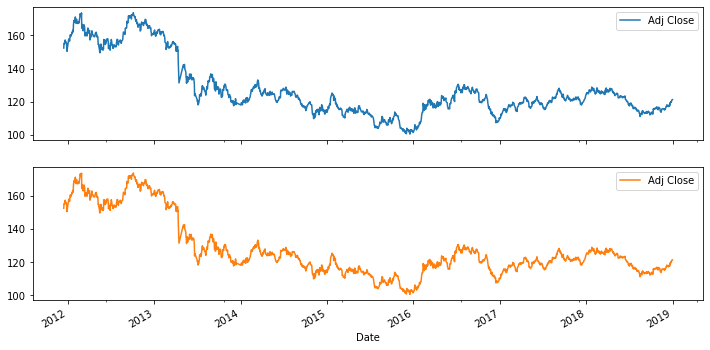

<Figure size 864x432 with 0 Axes>

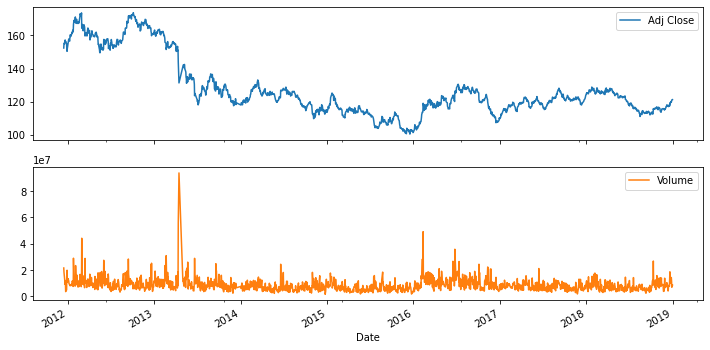

<Figure size 864x432 with 0 Axes>

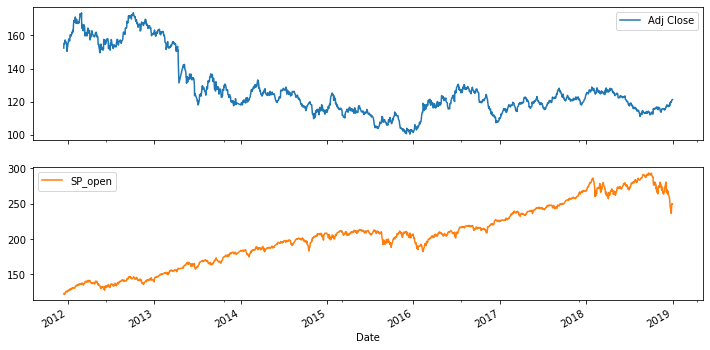

<Figure size 864x432 with 0 Axes>

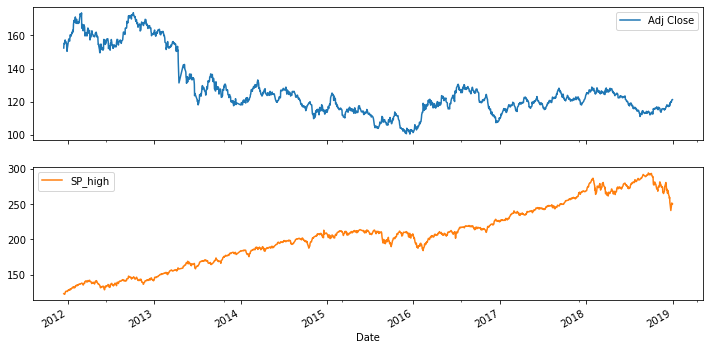

<Figure size 864x432 with 0 Axes>

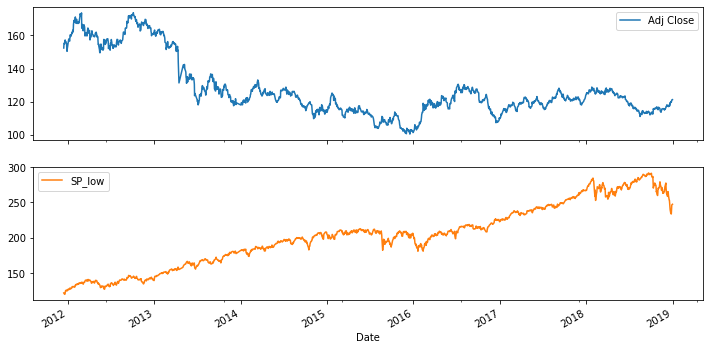

<Figure size 864x432 with 0 Axes>

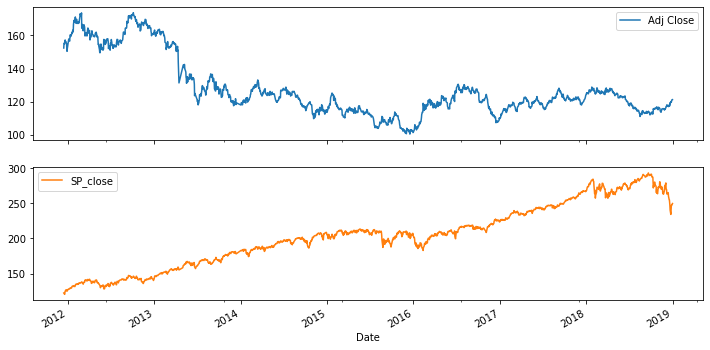

<Figure size 864x432 with 0 Axes>

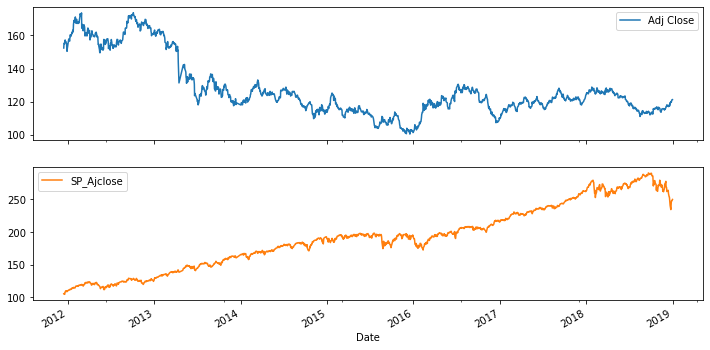

<Figure size 864x432 with 0 Axes>

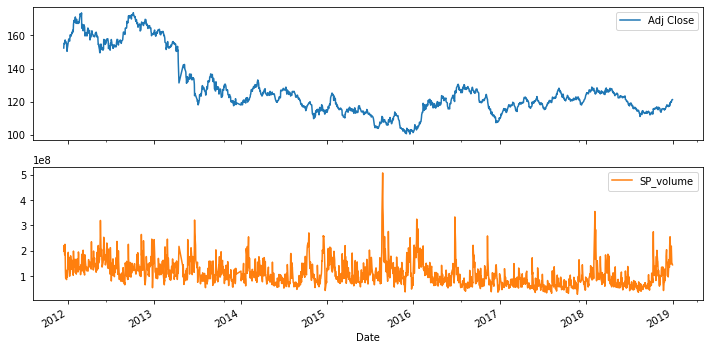

<Figure size 864x432 with 0 Axes>

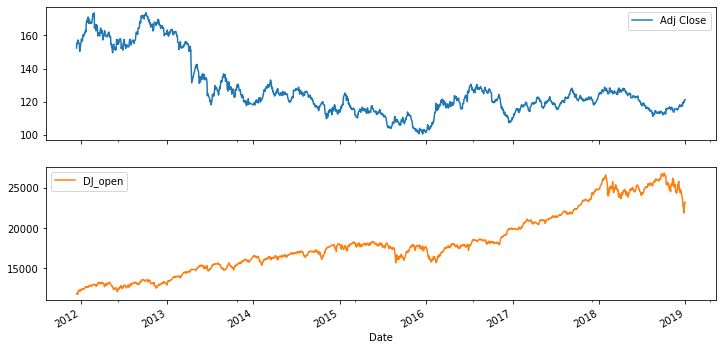

<Figure size 864x432 with 0 Axes>

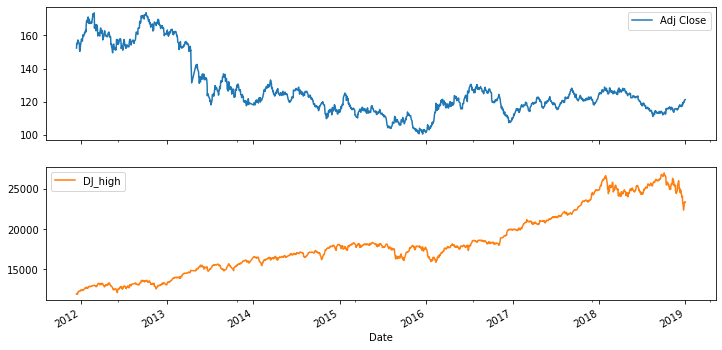

<Figure size 864x432 with 0 Axes>

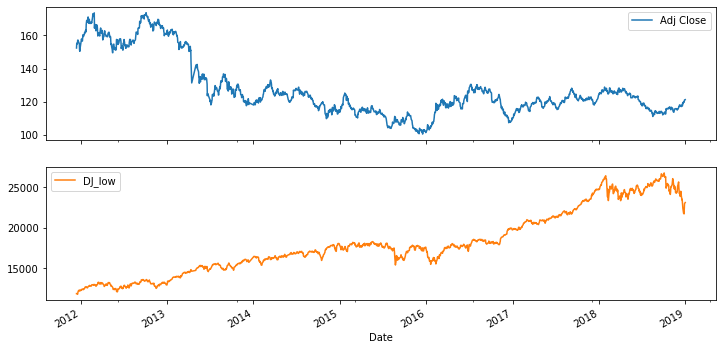

<Figure size 864x432 with 0 Axes>

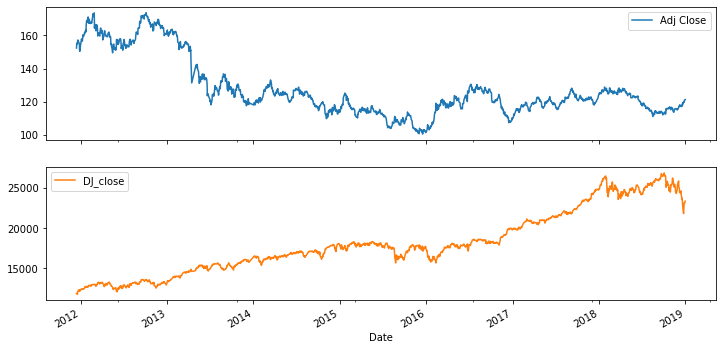

<Figure size 864x432 with 0 Axes>

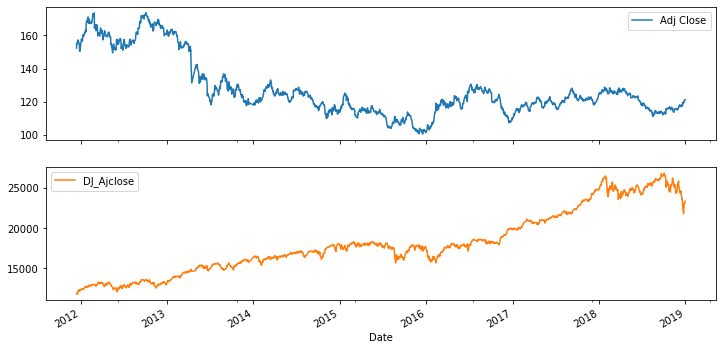

<Figure size 864x432 with 0 Axes>

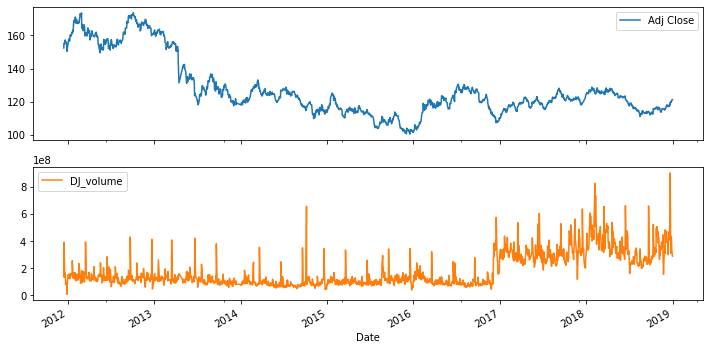

<Figure size 864x432 with 0 Axes>

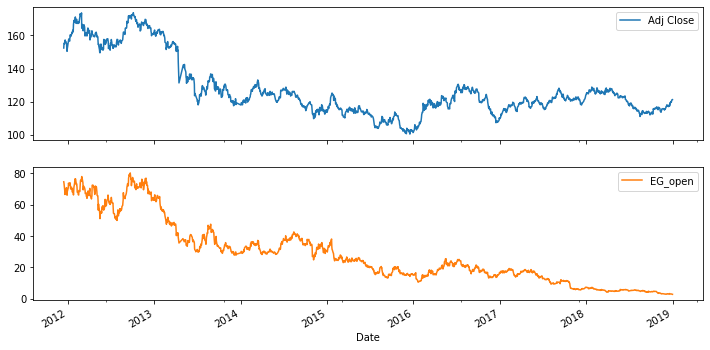

<Figure size 864x432 with 0 Axes>

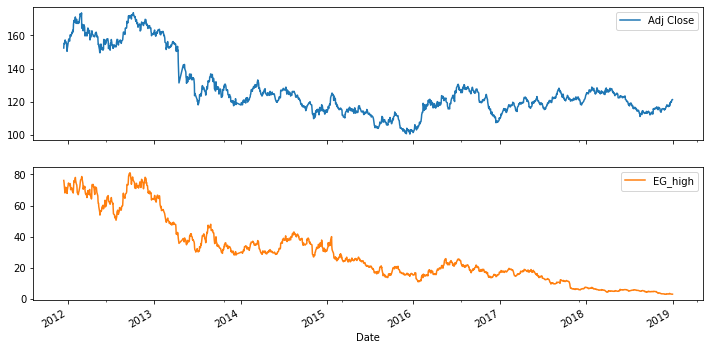

<Figure size 864x432 with 0 Axes>

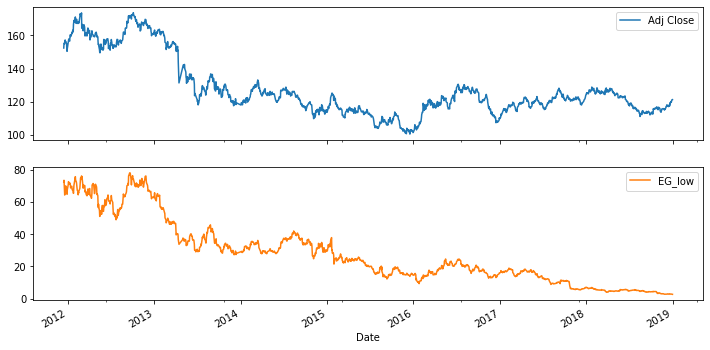

<Figure size 864x432 with 0 Axes>

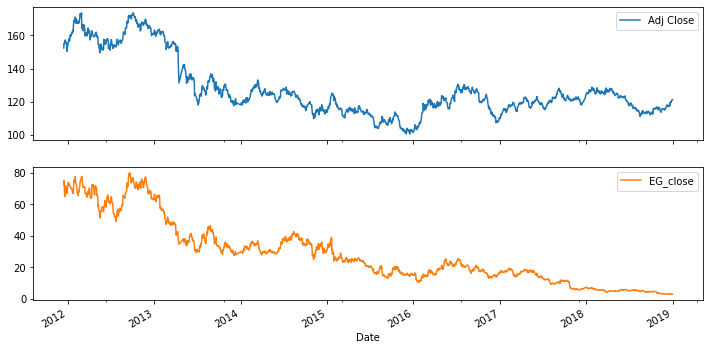

<Figure size 864x432 with 0 Axes>

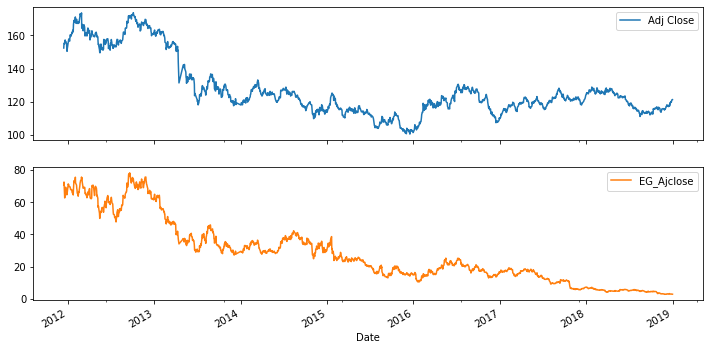

<Figure size 864x432 with 0 Axes>

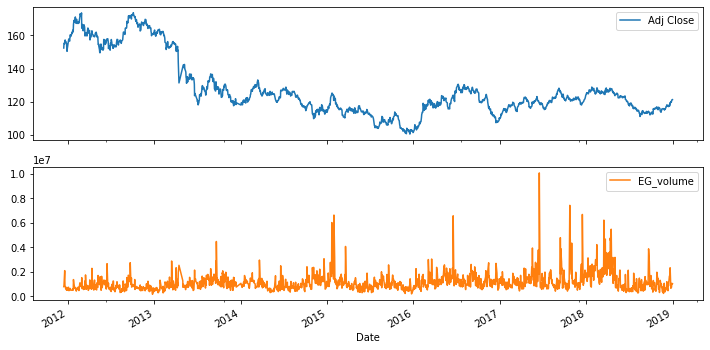

<Figure size 864x432 with 0 Axes>

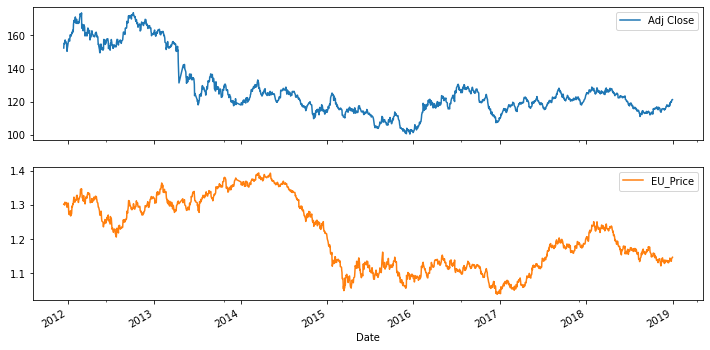

<Figure size 864x432 with 0 Axes>

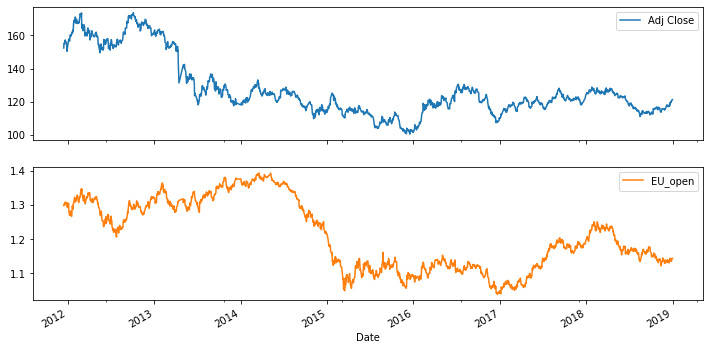

<Figure size 864x432 with 0 Axes>

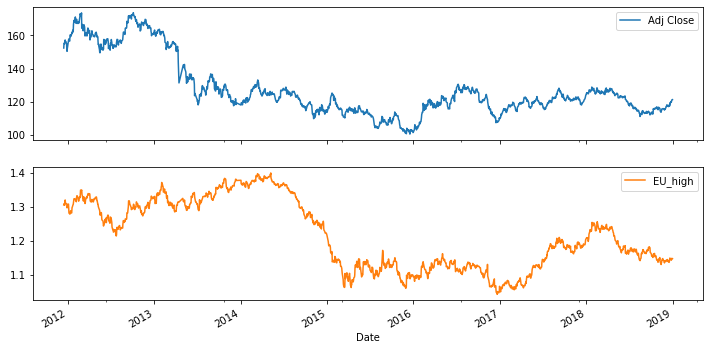

<Figure size 864x432 with 0 Axes>

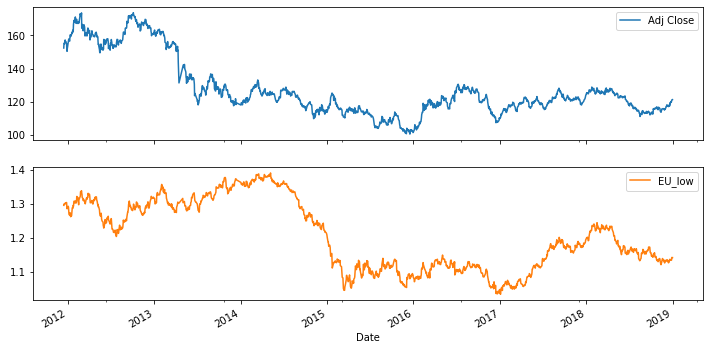

<Figure size 864x432 with 0 Axes>

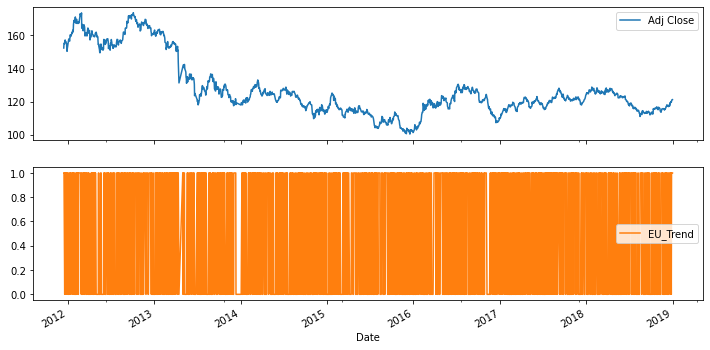

<Figure size 864x432 with 0 Axes>

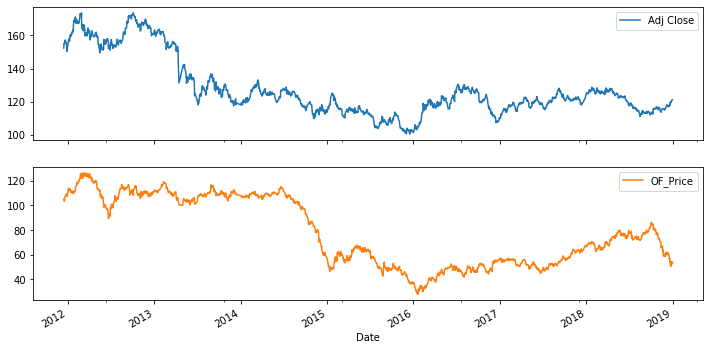

<Figure size 864x432 with 0 Axes>

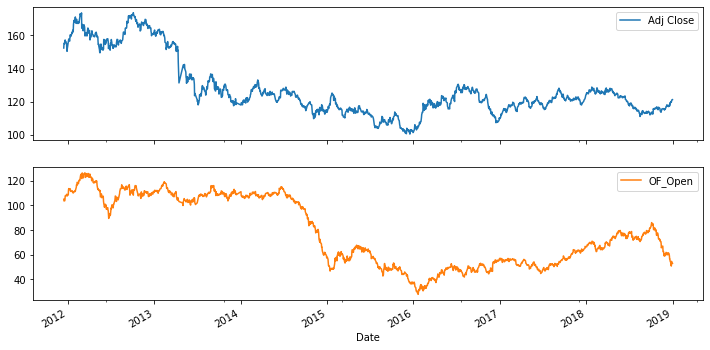

<Figure size 864x432 with 0 Axes>

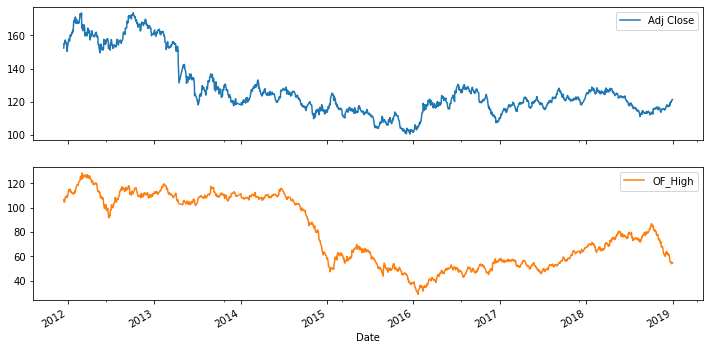

<Figure size 864x432 with 0 Axes>

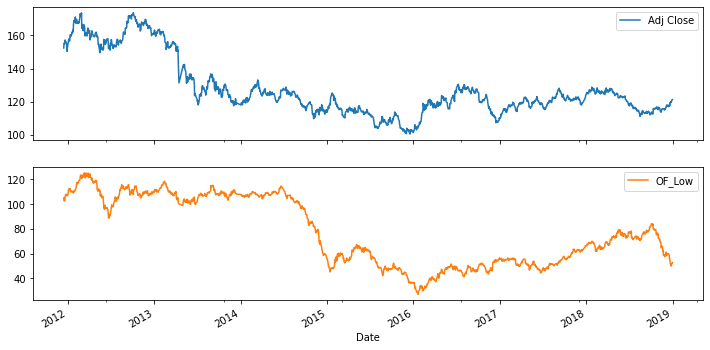

<Figure size 864x432 with 0 Axes>

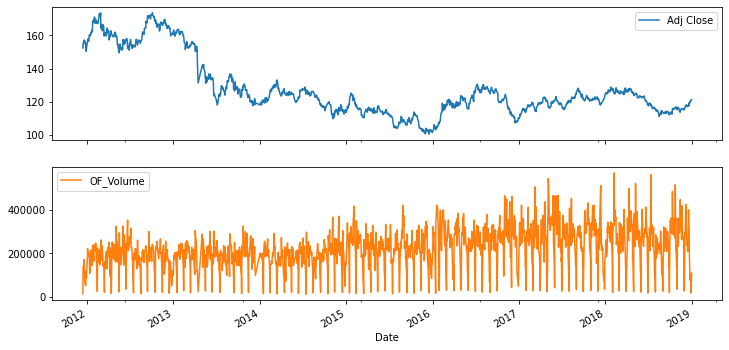

<Figure size 864x432 with 0 Axes>

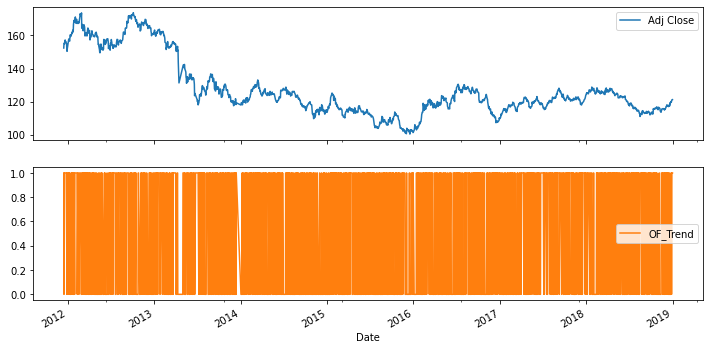

<Figure size 864x432 with 0 Axes>

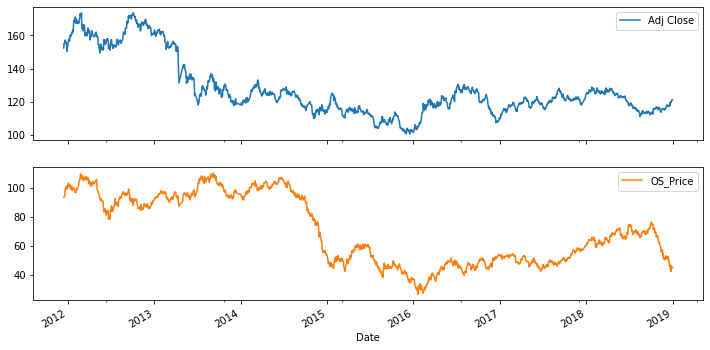

<Figure size 864x432 with 0 Axes>

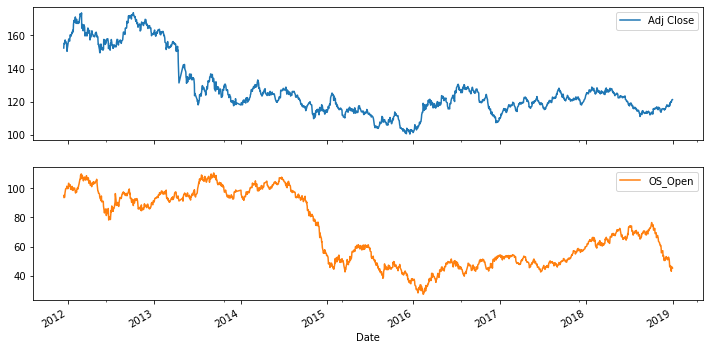

<Figure size 864x432 with 0 Axes>

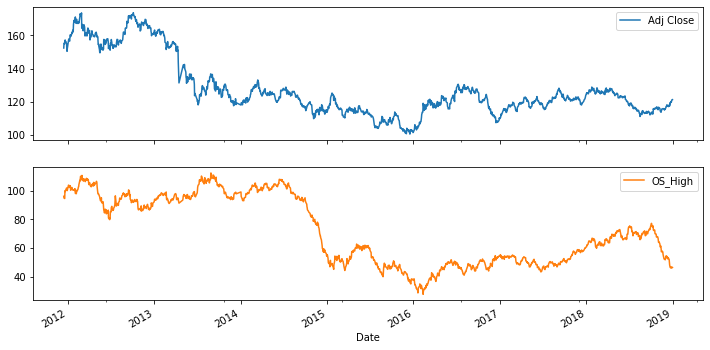

<Figure size 864x432 with 0 Axes>

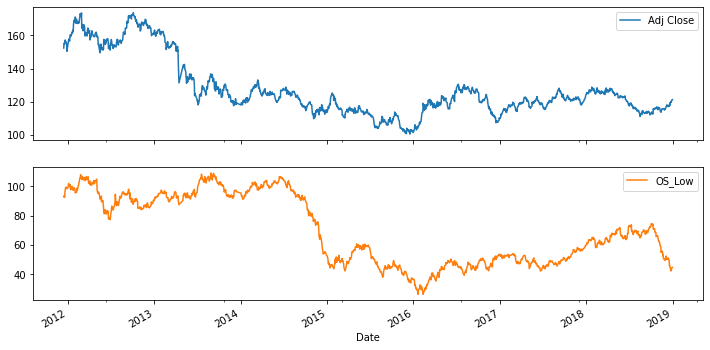

<Figure size 864x432 with 0 Axes>

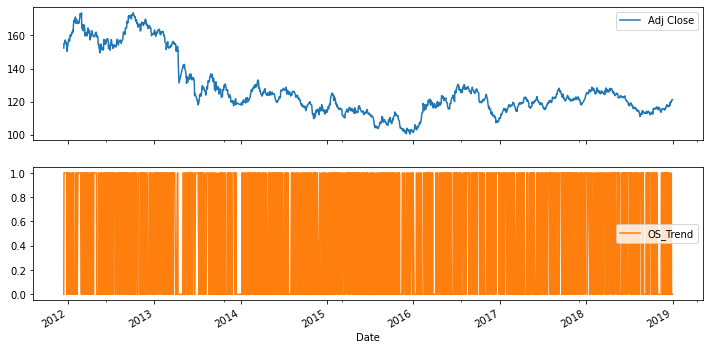

<Figure size 864x432 with 0 Axes>

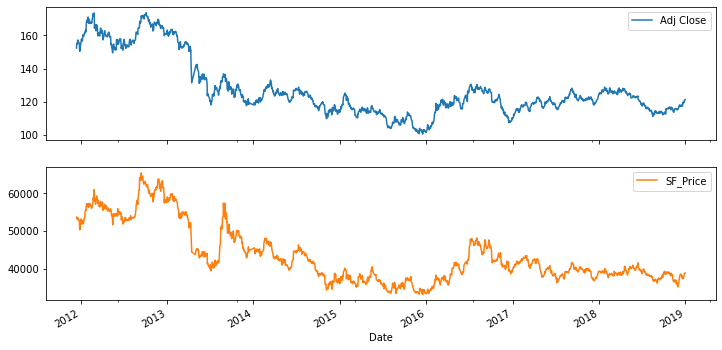

<Figure size 864x432 with 0 Axes>

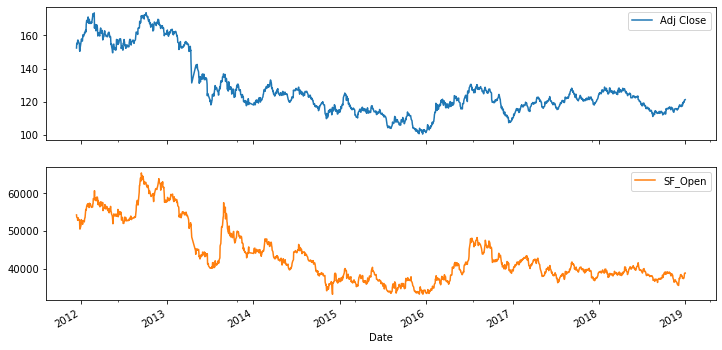

<Figure size 864x432 with 0 Axes>

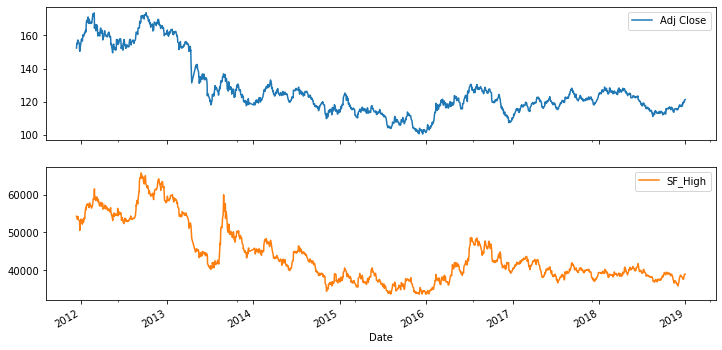

<Figure size 864x432 with 0 Axes>

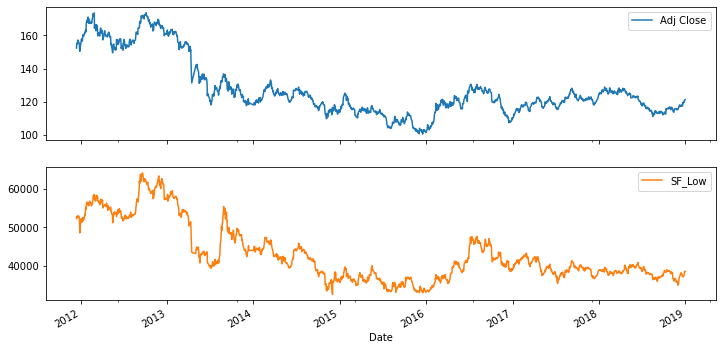

<Figure size 864x432 with 0 Axes>

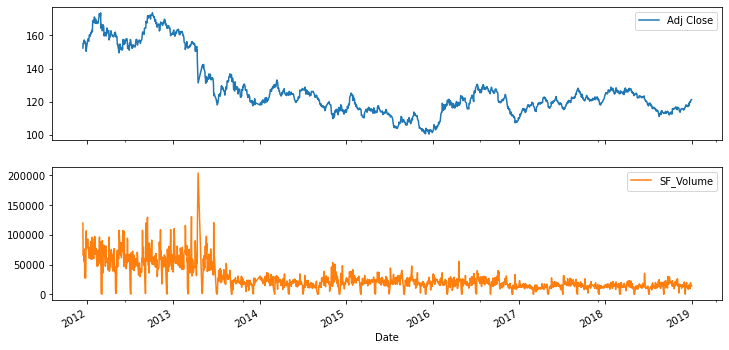

<Figure size 864x432 with 0 Axes>

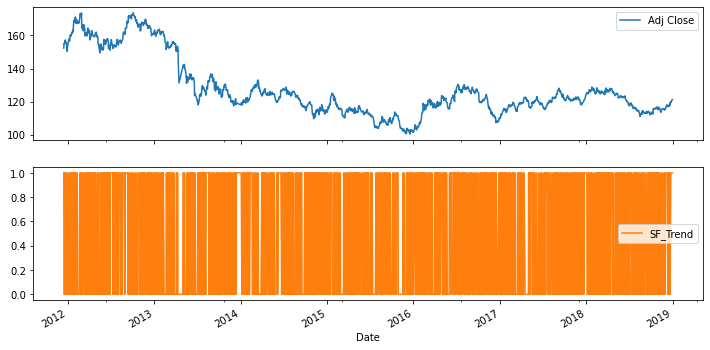

<Figure size 864x432 with 0 Axes>

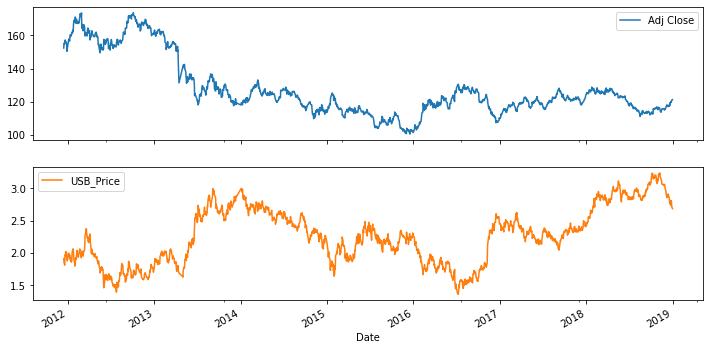

<Figure size 864x432 with 0 Axes>

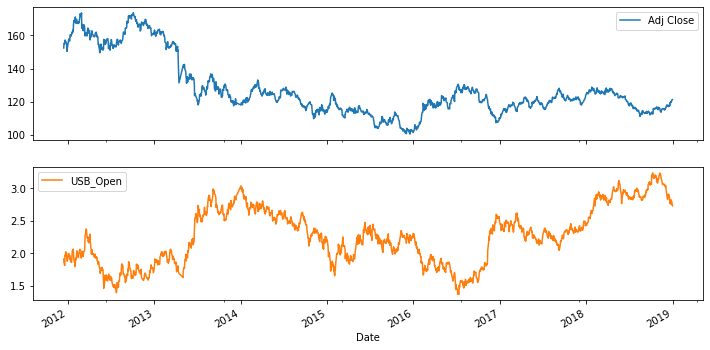

<Figure size 864x432 with 0 Axes>

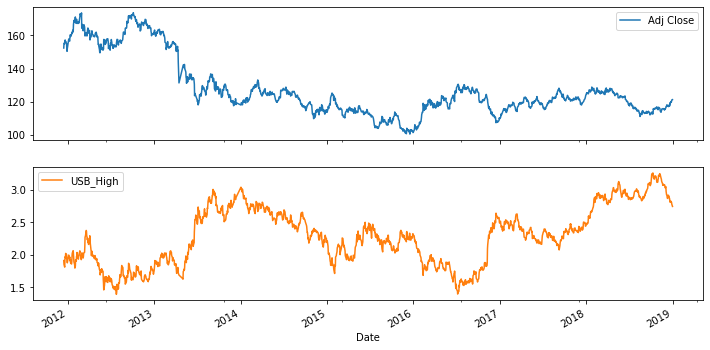

<Figure size 864x432 with 0 Axes>

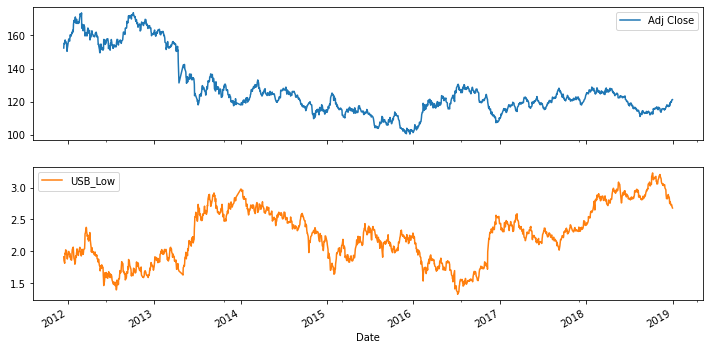

<Figure size 864x432 with 0 Axes>

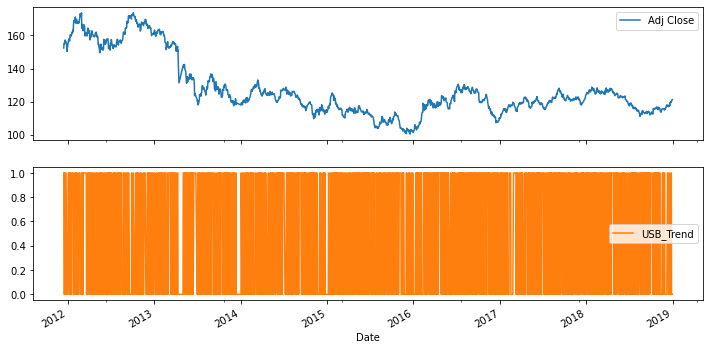

<Figure size 864x432 with 0 Axes>

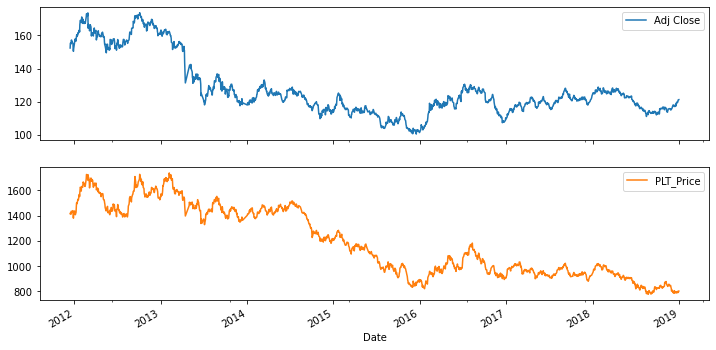

<Figure size 864x432 with 0 Axes>

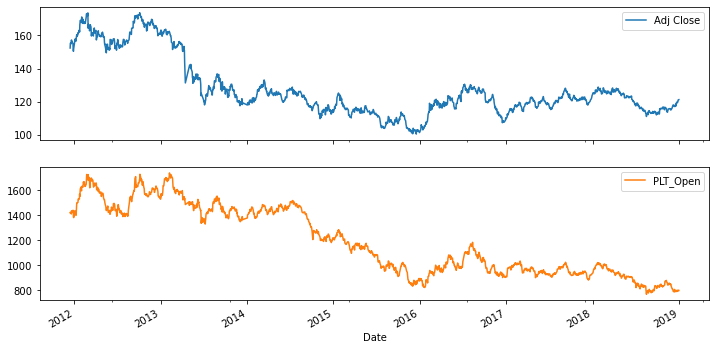

<Figure size 864x432 with 0 Axes>

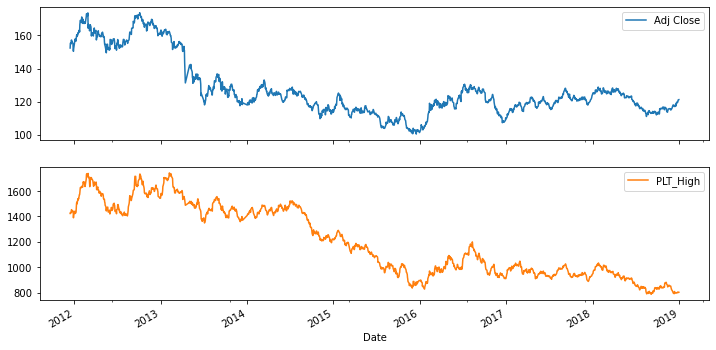

<Figure size 864x432 with 0 Axes>

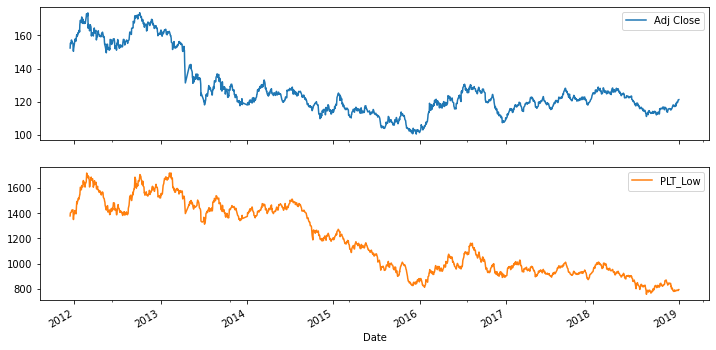

<Figure size 864x432 with 0 Axes>

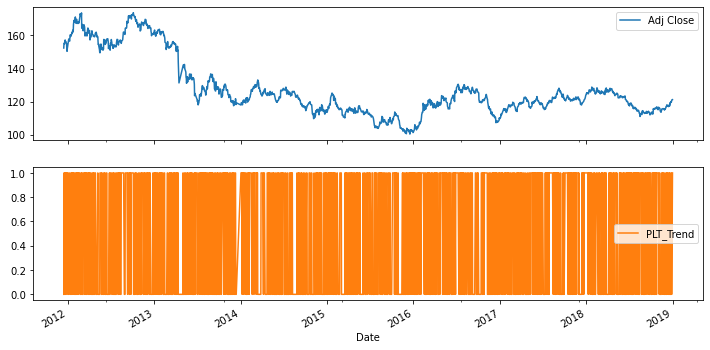

<Figure size 864x432 with 0 Axes>

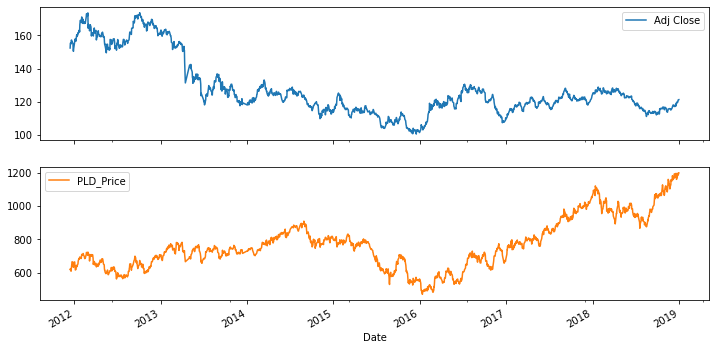

<Figure size 864x432 with 0 Axes>

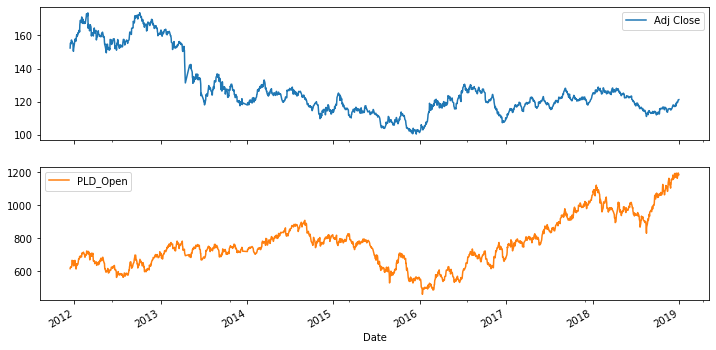

<Figure size 864x432 with 0 Axes>

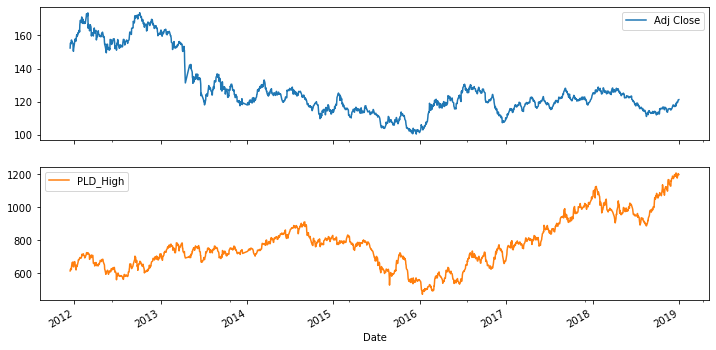

<Figure size 864x432 with 0 Axes>

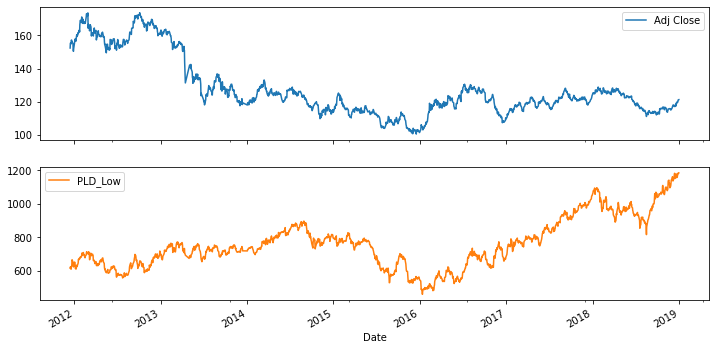

<Figure size 864x432 with 0 Axes>

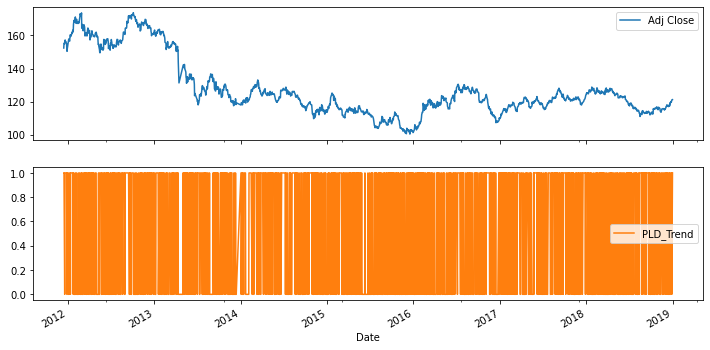

<Figure size 864x432 with 0 Axes>

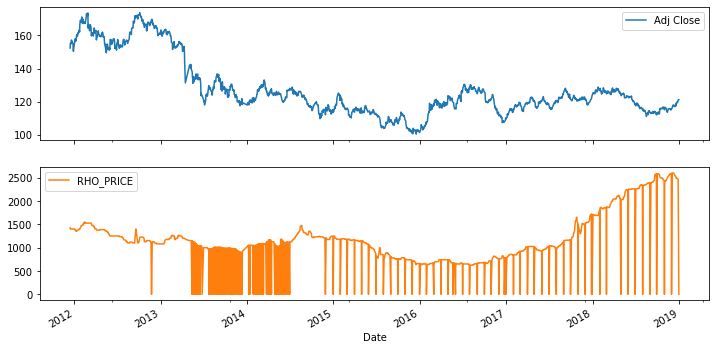

<Figure size 864x432 with 0 Axes>

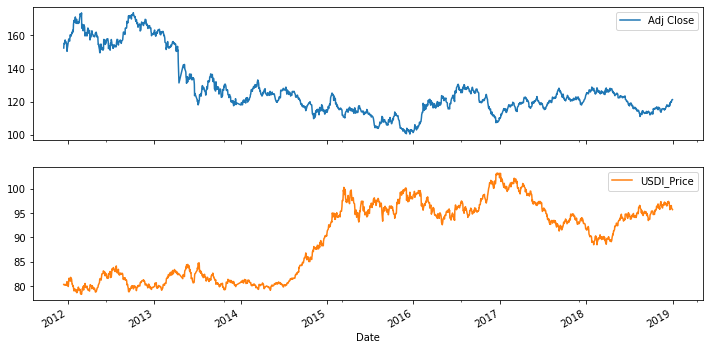

<Figure size 864x432 with 0 Axes>

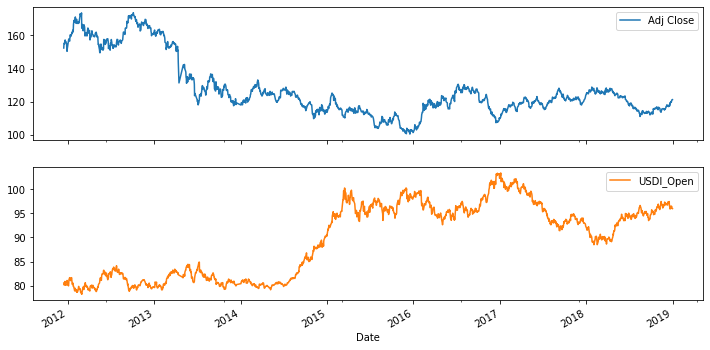

<Figure size 864x432 with 0 Axes>

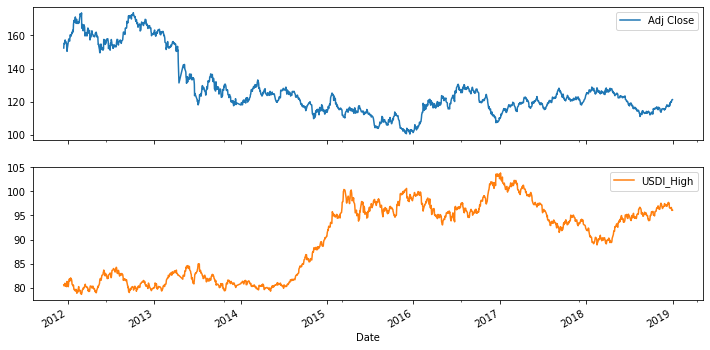

<Figure size 864x432 with 0 Axes>

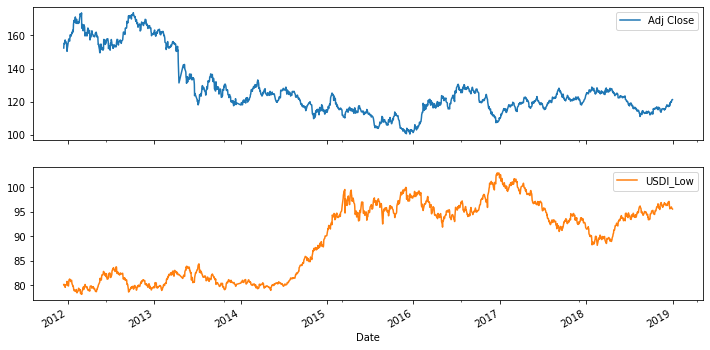

<Figure size 864x432 with 0 Axes>

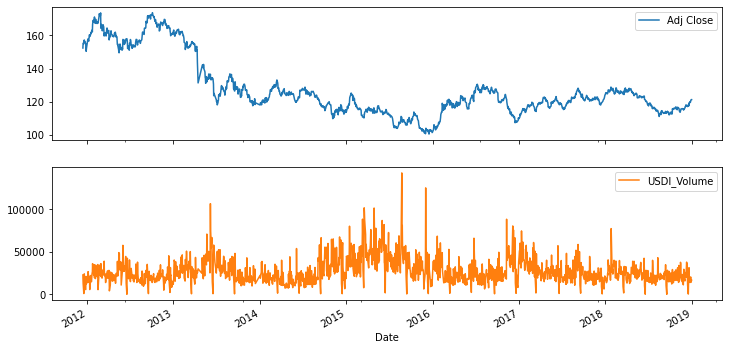

<Figure size 864x432 with 0 Axes>

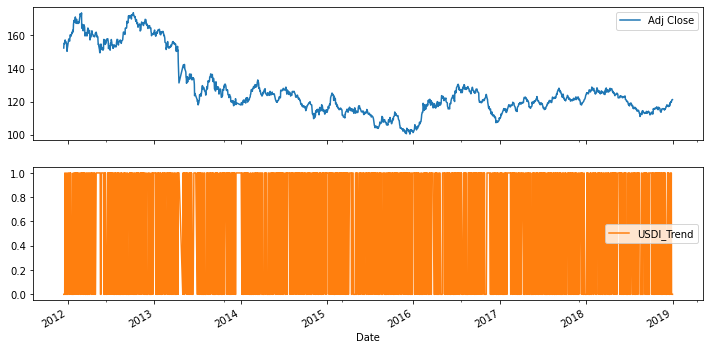

<Figure size 864x432 with 0 Axes>

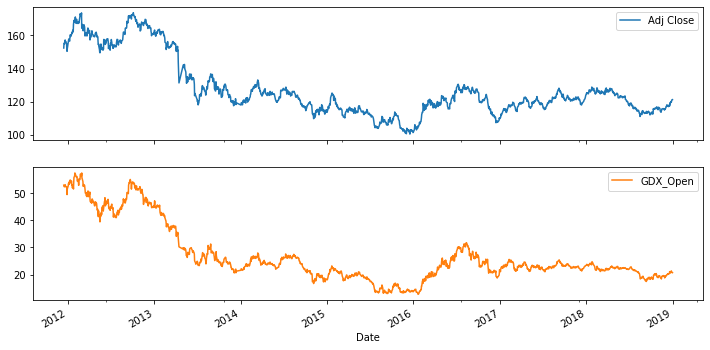

<Figure size 864x432 with 0 Axes>

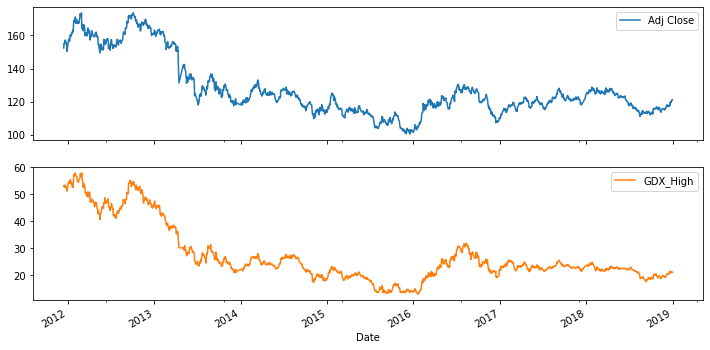

<Figure size 864x432 with 0 Axes>

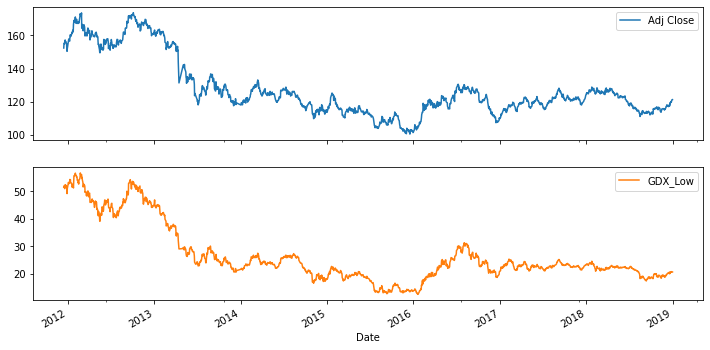

<Figure size 864x432 with 0 Axes>

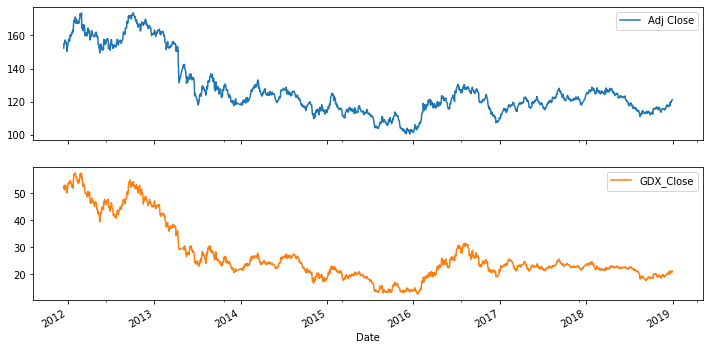

<Figure size 864x432 with 0 Axes>

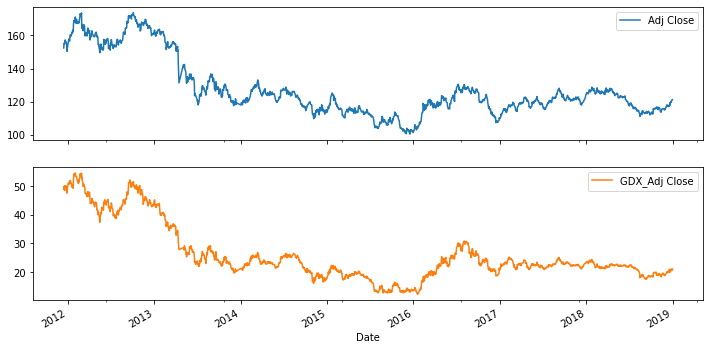

<Figure size 864x432 with 0 Axes>

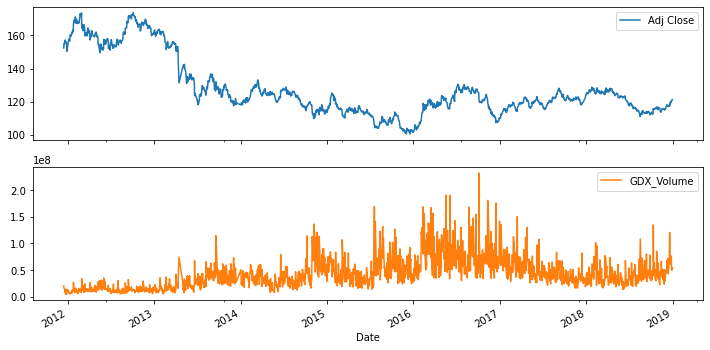

<Figure size 864x432 with 0 Axes>

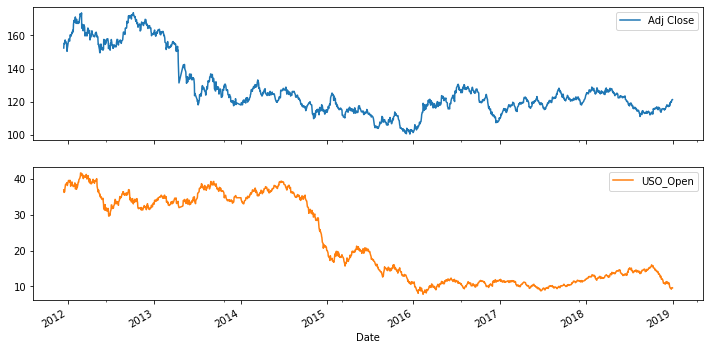

<Figure size 864x432 with 0 Axes>

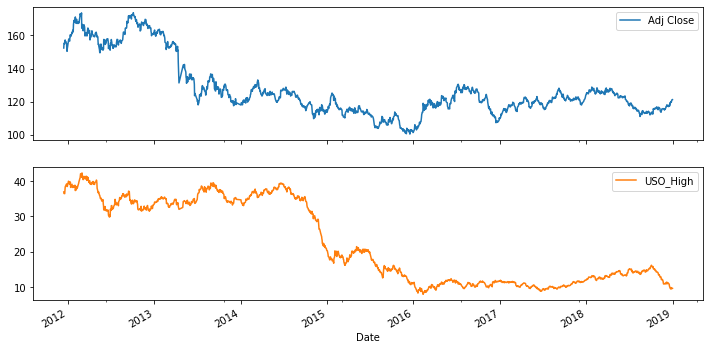

<Figure size 864x432 with 0 Axes>

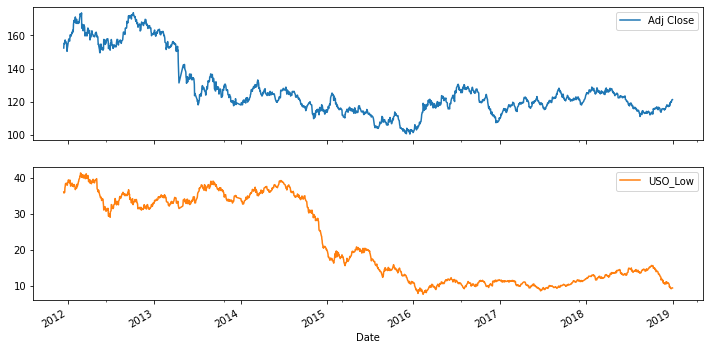

<Figure size 864x432 with 0 Axes>

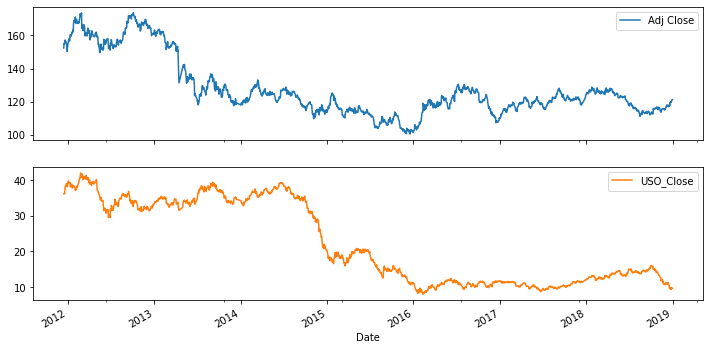

<Figure size 864x432 with 0 Axes>

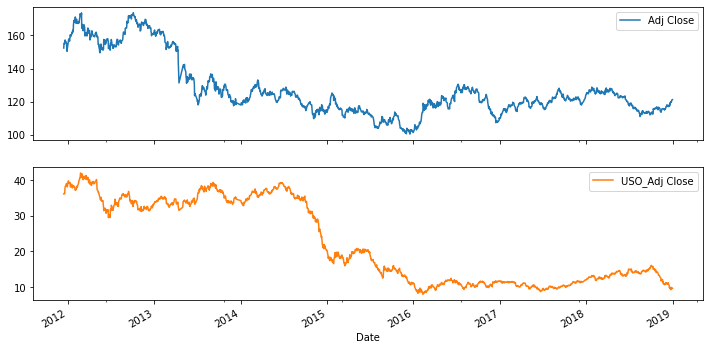

<Figure size 864x432 with 0 Axes>

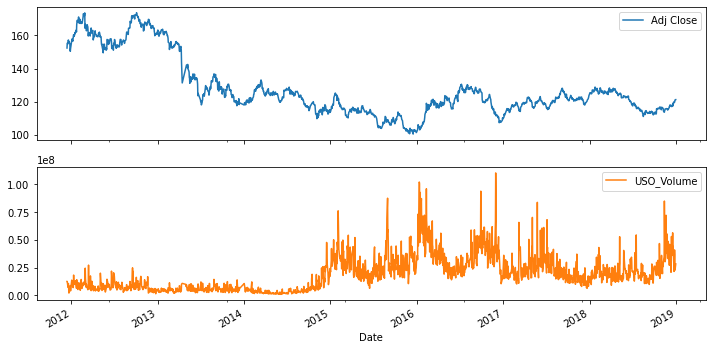

In [26]:
for col in df.columns:
    plt.figure(figsize=(12,6))
    df[['Adj Close',col]].plot.line(subplots=True, figsize=(12, 6))
    plt.savefig(f'img/AdjClose{col}.png', dpi=200)
    plt.show()

In [27]:
# plot(df, display=['Stats', 'Bar Chart', 'Box Plot'])

## 2 Prédire le prix de l’or

  0%|                                                                                         | 0/1836 [00:00<…


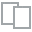
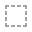
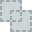
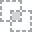
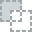
...
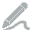
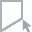
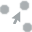
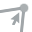
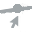

In [28]:
plot_correlation(df, "Adj Close")

In [29]:
# calcule le coéfficient de corrélation entre la variable cible et toutes les autres variables
corr_matrix=df.corr()
coef=corr_matrix["Adj Close"]

# Enregistre la valeur du coefficient de corrélation calculé précédement
coef_cor = pd.DataFrame(coef).T.abs()

In [30]:
# Recupère les variables qui sont corrélés à plus de 0.5 de la target variable
feat_import = coef_cor[coef_cor.loc[:] >= 0.5].dropna(axis=1)
feat_import.drop(columns="Adj Close", inplace=True)

In [31]:
feat_import

,Open,High,Low,Close,SP_open,SP_high,SP_low,SP_close,SP_Ajclose,DJ_open,...,GDX_High,GDX_Low,GDX_Close,GDX_Adj Close,GDX_Volume,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close
Adj Close,0.998976,0.999535,0.999532,1.0,0.684618,0.684904,0.68375,0.684284,0.666071,0.5888,...,0.975255,0.975561,0.975459,0.97498,0.514616,0.635197,0.635311,0.634732,0.635675,0.635675


### Donnée entraînement et de test

In [32]:
from sklearn.model_selection import train_test_split

In [33]:
trainset, testset = train_test_split(df, test_size=0.25, random_state=0)

In [34]:
def XsplitY(dataframe):
    
    Y = dataframe['Adj Close']
    X = dataframe[feat_import.columns]
    
    return X, Y

In [35]:
X_train, Y_train = XsplitY(trainset)
X_test, Y_test = XsplitY(testset)

In [36]:
import warnings
warnings.filterwarnings("ignore")

In [37]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

from sklearn.model_selection import learning_curve
import sklearn.metrics as metrics

from sklearn.linear_model import SGDClassifier
from sklearn import linear_model
from sklearn import svm
from sklearn import linear_model

### Modelisation

In [38]:
## Ensemble de modèles tester
# pipe_sgd = make_pipeline(StandardScaler(), SGDClassifier())
sgd = SGDClassifier()
lasso = linear_model.Lasso(alpha=0.1)
svm = svm.SVR()
ridge = linear_model.Ridge(alpha=.5)

In [39]:
dict_of_models = {
                  'Lasso' : lasso,
                  'SVM': svm,
                  'Ridge': ridge,
#                   'SGD': sgd,
                 }

In [40]:
def evaluation(model):
    
    model.fit(X_train, Y_train)
    ypred = model.predict(X_test)
    
    print(f"Entraînement: {model.score(X_train, Y_train)}\nTest: {model.score(X_test, Y_test)}")
#     print(classification_report(Y_test, ypred))
    
    N, train_score, val_score = learning_curve(model, X_train, Y_train,
                                               cv=4, train_sizes=np.linspace(0.1, 1, 10))
    
    plt.figure(figsize=(12, 5))
    plt.plot(N, train_score.mean(axis=1), label='train score')
    plt.plot(N, val_score.mean(axis=1), label='validation score')
    plt.title(model, fontsize=24)
    plt.legend()

Lasso
Entraînement: 0.9998148366292555
Test: 0.9998266147058309
SVM
Entraînement: 0.5218695722718509
Test: 0.5414112862395726
Ridge
Entraînement: 0.9999999923767184
Test: 0.999999992438015


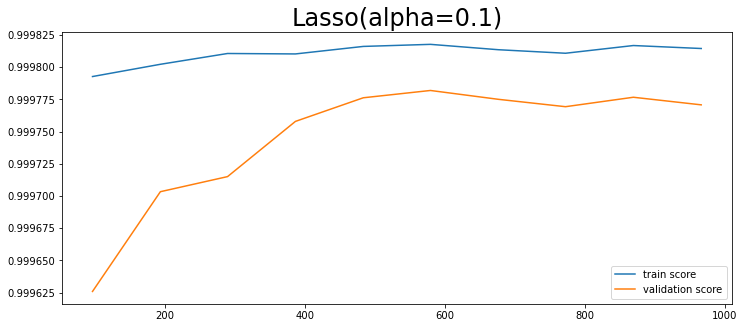

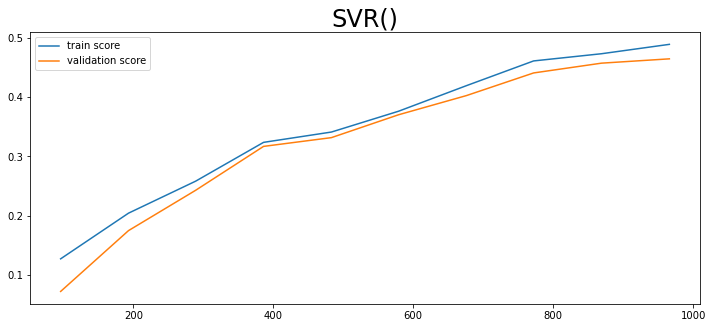

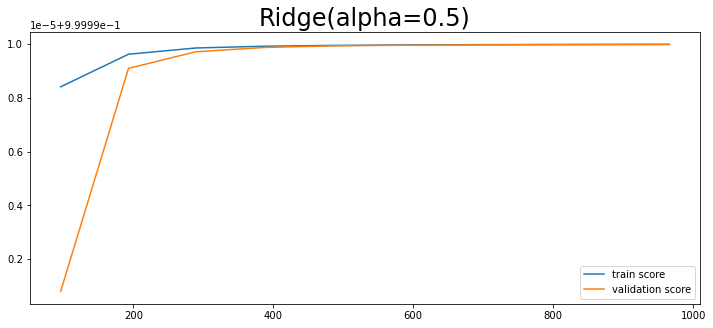

In [41]:
for name, model in dict_of_models.items():
    print(name)
    evaluation(model)

In [42]:
ridge.fit(X_train, Y_train)
ridge.score(X_test, Y_test)

0.999999992438015

## Prédiction selon le temps

Tout d'abord, nous devons vérifier si une série est stationnaire ou non, car l'analyse des séries chronologiques ne fonctionne qu'avec des données stationnaires.

Test de stationnarité :

Pour identifier la nature des données, nous utiliserons l'hypothèse nulle.

H0 : **L'hypothèse nulle** : C'est une déclaration sur la population qui est considérée comme vraie ou qui est utilisée pour avancer un argument à moins qu'elle ne puisse être démontrée incorrecte au-delà de tout doute raisonnable.


H1 : **L'hypothèse alternative** : C'est une affirmation sur la population qui est en contradiction avec H 0 et ce que nous concluons lorsque nous rejetons H 0 .

#Ho : **La serie est non stationnaire**

#H1 : **Elle est à stationnaire**
Si l'on ne rejette pas l'hypothèse nulle, on peut dire que la série est non stationnaire. Cela signifie que la série peut être linéaire.


***Si la moyenne et l'écart type sont des lignes plates (moyenne constante et variance constante), la série devient stationnaire.***

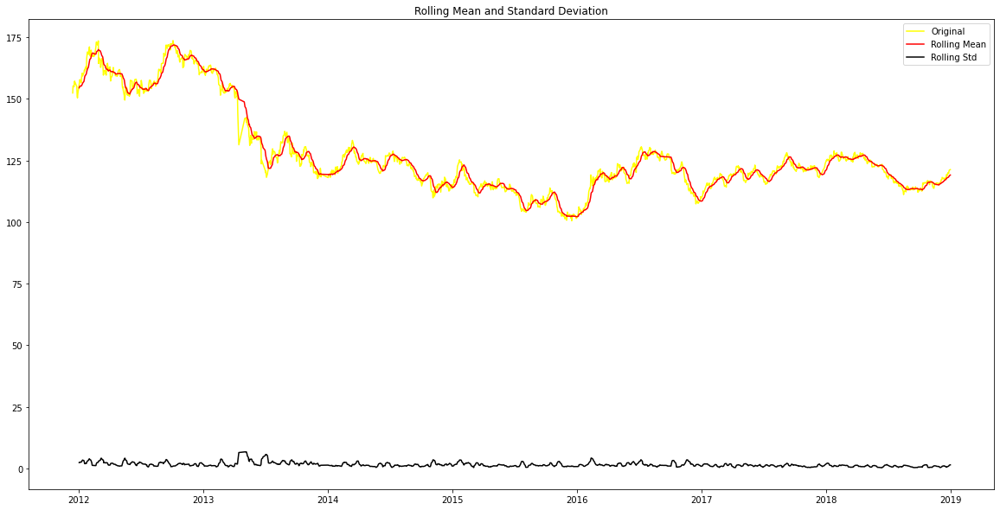

Results of dickey fuller test
Test Statistics                  -1.823460
p-value                           0.368878
No. of lags used                  1.000000
Number of observations used    1716.000000
critical value (1%)              -3.434166
critical value (5%)              -2.863226
critical value (10%)             -2.567667
dtype: float64


In [43]:
from statsmodels.tsa.stattools import adfuller
def test_stationarity(timeseries):
    #Determing rolling statistics
    rolmean = timeseries.rolling(12).mean()
    rolstd = timeseries.rolling(12).std()
    #Plot rolling statistics:
    plt.plot(timeseries, color='yellow',label='Original')
    plt.plot(rolmean, color='red', label='Rolling Mean')
    plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean and Standard Deviation')
    plt.show(block=False)
    print("Results of dickey fuller test")
    adft = adfuller(timeseries,autolag='AIC')
    # output for dft will give us without defining what the values are.
    #hence we manually write what values does it explains using a for loop
    output = pd.Series(adft[0:4],index=['Test Statistics','p-value','No. of lags used','Number of observations used'])
    for key,values in adft[4].items():
        output['critical value (%s)'%key] =  values
    print(output)
    
    
from matplotlib.pylab import rcParams
rcParams['figure.figsize']=(20,10)
   
test_stationarity(df['Adj Close'])

Après avoir analysé le graphique ci-dessus, nous constatons que la moyenne et l'écart type ne sont pas des lignes droites et, par conséquent, notre série n'est pas stationnaire.

Nous voyons que la p-value est supérieure à 0,05 donc nous ne pouvons pas rejeter l' hypothèse Null . De plus, les statistiques de test sont supérieures aux valeurs critiques. les données sont donc non stationnaires.

#### Pour l'analyse des séries chronologiques, nous séparons la tendance et la saisonnalité des séries chronologiques.

<Figure size 1440x720 with 0 Axes>

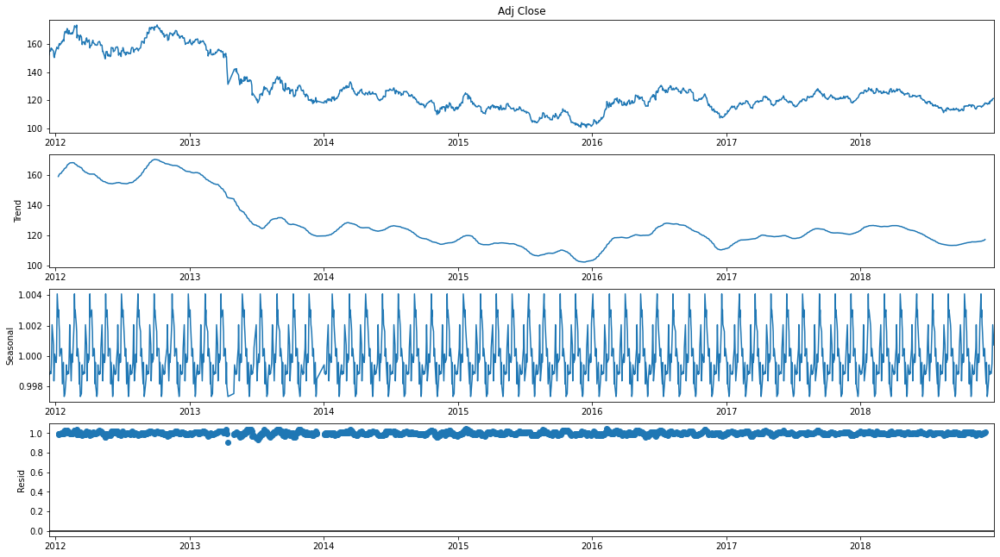

In [44]:
from statsmodels.tsa.seasonal import seasonal_decompose
df_close = df['Adj Close']
result = seasonal_decompose(df_close, model='multiplicative', freq = 30) 
fig = plt.figure()   
fig = result.plot()   
fig.set_size_inches(16, 9)

No handles with labels found to put in legend.


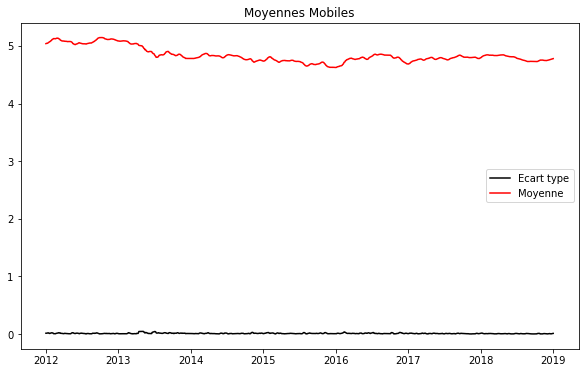

In [45]:
from pylab import rcParams
rcParams['figure.figsize'] = 10, 6
df_log = np.log(df_close)
moving_avg = df_log.rolling(12).mean()
std_dev = df_log.rolling(12).std()
plt.legend(loc='best')
plt.title('Moyennes Mobiles')
plt.plot(std_dev, color ="black", label = "Ecart type")
plt.plot(moving_avg, color="red", label = "Moyenne")
plt.legend()
plt.show()

In [46]:
df_close

Date
2011-12-15    152.330002
2011-12-16    155.229996
2011-12-19    154.869995
2011-12-20    156.979996
2011-12-21    157.160004
                 ...    
2018-12-24    120.019997
2018-12-26    119.660004
2018-12-27    120.570000
2018-12-28    121.059998
2018-12-31    121.250000
Name: Adj Close, Length: 1718, dtype: float64

In [47]:
from pmdarima.arima import auto_arima
trainset, testset = df_close[:'2018-01-17'], df_close['2018-06-17':]

model_autoARIMA = auto_arima(trainset, start_p=0, start_q=0,
                                test='adf',       # use adftest to find optimal 'd'
                                max_p=3, max_q=3, # maximum p and q
                                m=1,              # frequency of series
                                d=None,           # let model determine 'd'
                                seasonal=False,   # No Seasonality
                                start_P=0, 
                                D=0, 
                                trace=True,
                                error_action='ignore',  
                                suppress_warnings=True, 
                                stepwise=True
                            )
print(model_autoARIMA.summary())

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=5023.742, Time=1.36 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=5020.850, Time=0.32 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=5020.504, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=5022.009, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=5021.710, Time=1.47 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=5021.154, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=5019.050, Time=1.31 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=5021.016, Time=1.75 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=5021.019, Time=2.40 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=5022.657, Time=0.41 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=5019.196, Time=1.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=5023.046, Time=2.02 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=5017.364, Time=0.52 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=5019.480, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[0]          

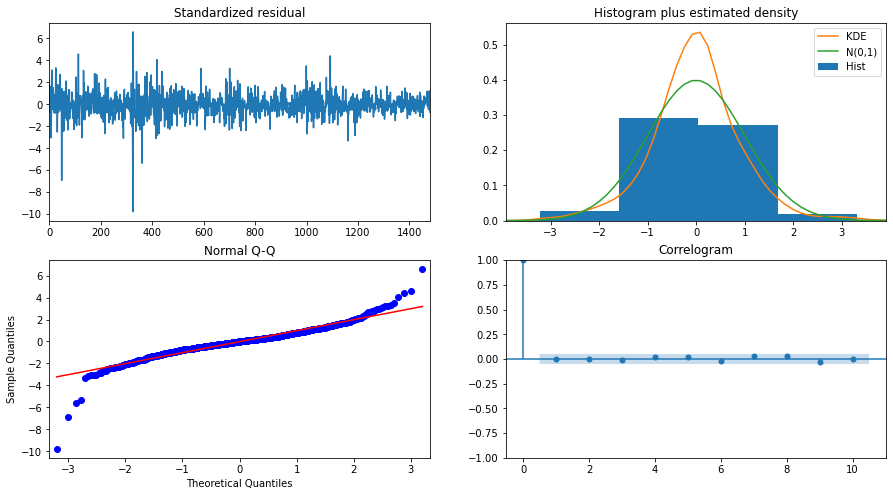

In [48]:
model_autoARIMA.plot_diagnostics(figsize=(15,8))
plt.show()

In [49]:
import warnings
warnings.filterwarnings('ignore')

In [57]:
model_autoARIMA.fit(trainset)

ARIMA(order=(1, 1, 2), scoring_args={}, suppress_warnings=True,
      with_intercept=False)

In [63]:
future_forecast = model_autoARIMA.predict(n_periods=1481)

<AxesSubplot:xlabel='Date'>

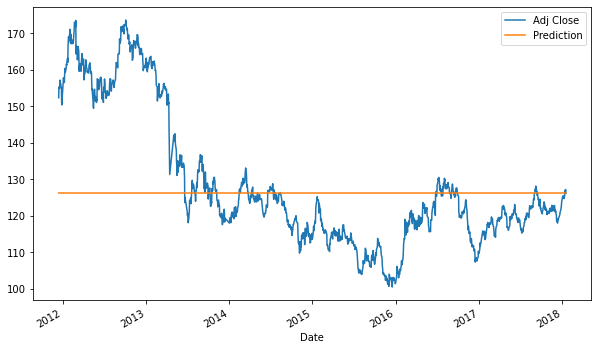

In [65]:
future_forecast = pd.DataFrame(future_forecast,index=trainset.index,columns=['Prediction'])
pd.concat([trainset,future_forecast],axis=1).plot()

In [67]:
pd.concat([trainset,future_forecast],axis=1).iplot()

AttributeError: 'DataFrame' object has no attribute 'iplot'